In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import h5py
import matplotlib.pyplot as plt
from os.path import join, exists
import os
import matplotlib as mpl
mpl.style.use('style.mcstyle')
import optuna
from tqdm import tqdm

# os.chdir('/home/x-mho1/git/ltu-cmass-run')

from astropy.cosmology import Planck18 as cosmo

from cmass.utils import load_params, cosmo_to_astropy

/u/maho3/anaconda3/envs/cmass/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
wdir = '/work/hdd/bdne/maho3/cmass-ili'

In [3]:
truesim = 'quijote/nbody'
# oldsim = 'quijote/nbodyconc'
oldsim = 'quijotelike/fastpm'
newsim = 'quijotelike/fastpm_charm4'

lhid = 0
L, N = 1000, 128
z = 0.5
a = f'{(1.0 / (1.0 + z)):.6f}'

cosmo = load_params(
    lhid, '/u/maho3/git/ltu-cmass/params/latin_hypercube_params.txt')
cosmo = cosmo_to_astropy(cosmo)

In [4]:
truepath = join(wdir, truesim, f'L{L}-N{N}', str(lhid))
oldpath = join(wdir, oldsim, f'L{L}-N{N}', str(lhid))
newpath = join(wdir, newsim, f'L{L}-N{N}', str(lhid))

In [13]:
filepath = join(oldpath, 'nbody.h5')
with h5py.File(filepath, 'r') as f:
    field = f[a]['rho'][...]

filepath = join(truepath, 'halos.h5')
with h5py.File(filepath, 'r') as f:
    true = {k: f[a][str(k)][:] for k in list(f[a].keys())}

filepath = join(oldpath, 'halos.h5')
with h5py.File(filepath, 'r') as f:
    old = {k: f[a][str(k)][:] for k in list(f[a].keys())}

filepath = join(newpath, 'halos.h5')
with h5py.File(filepath, 'r') as f:
    new = {k: f[a][str(k)][:] for k in list(f[a].keys())}

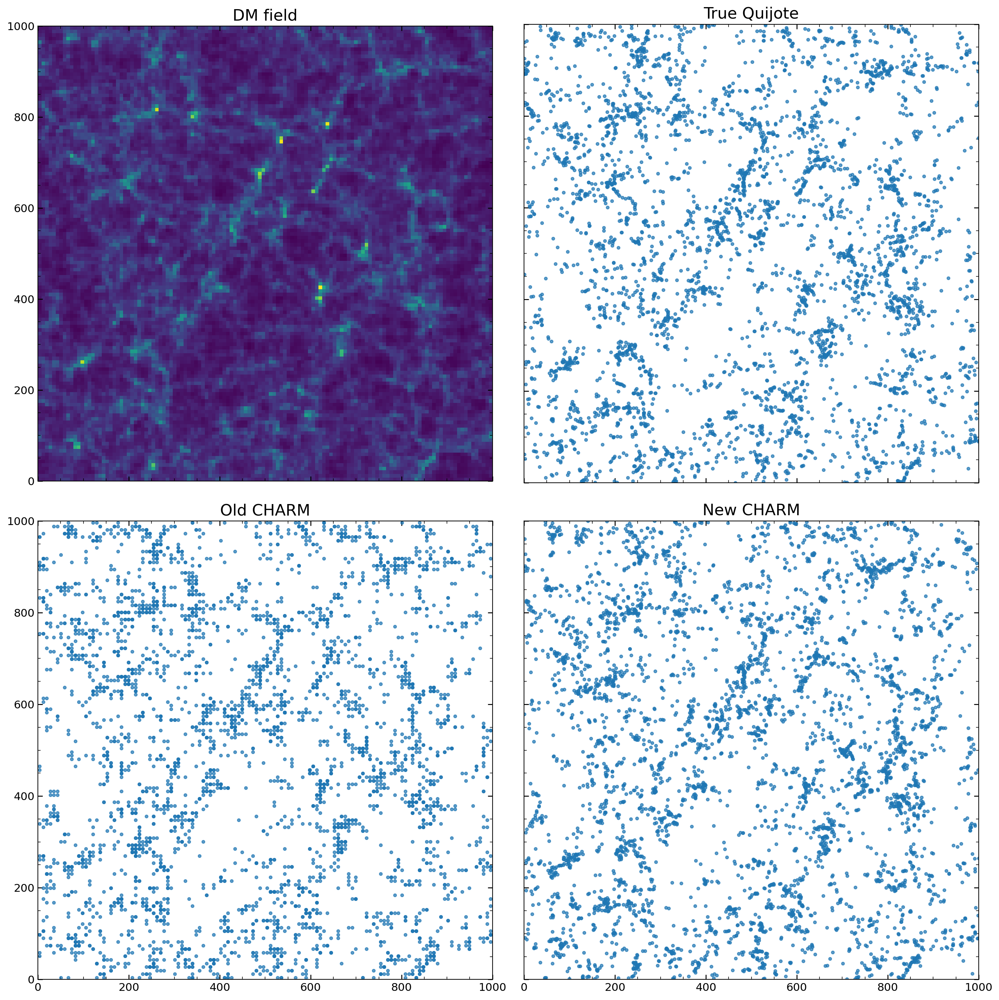

In [14]:
idxmin, idxmax = (0, 5)

zmin, zmax = idxmin*L/N, idxmax*L/N

f, axs = plt.subplots(2, 2, figsize=(15, 15), sharex=True, sharey=True)
axs = axs.flatten()

ax = axs[0]
x = field[:, :, idxmin:idxmax].mean(axis=-1).T
ax.imshow(x, extent=[0, L, 0, L])
ax.set_title('DM field')

ax = axs[1]
x = true['pos']
mask = (x[:, 2] > zmin) & (x[:, 2] < zmax)
ax.plot(x[mask, 0], x[mask, 1], '.', alpha=0.7)
ax.set_title('True Quijote')

ax = axs[2]
x = old['pos']
mask = (x[:, 2] > zmin) & (x[:, 2] < zmax)
ax.plot(x[mask, 0], x[mask, 1], '.', alpha=0.7)
ax.set_title('Old CHARM')

ax = axs[3]
x = new['pos']
mask = (x[:, 2] > zmin) & (x[:, 2] < zmax)
ax.plot(x[mask, 0], x[mask, 1], '.', alpha=0.7)
ax.set_title('New CHARM')

plt.tight_layout()

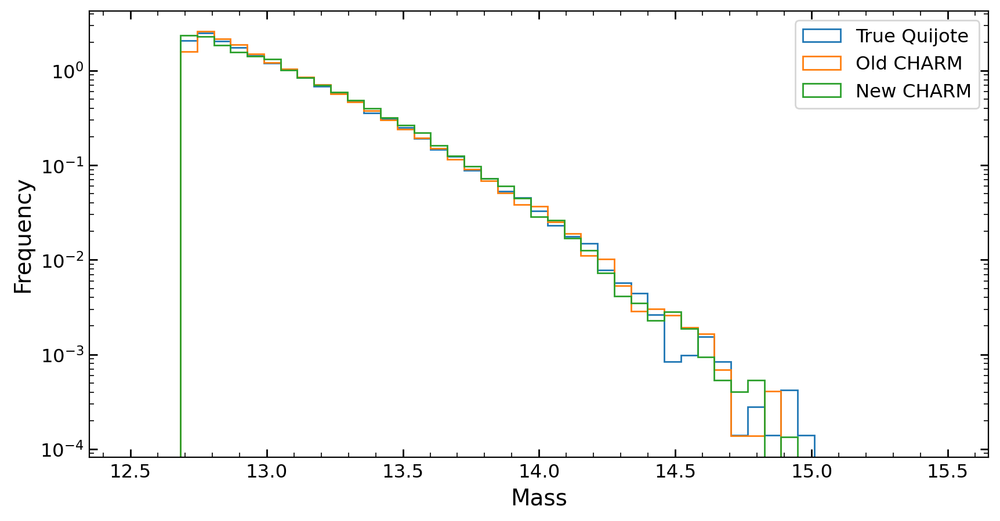

In [15]:
f, ax = plt.subplots(figsize=(10, 5))

ax.semilogy()
mbins = np.linspace(12.5, 15.5, 50)
ax.hist(true['mass'], bins=mbins, histtype='step',
        label='True Quijote', density=True)
ax.hist(old['mass'], bins=mbins, histtype='step',
        label='Old CHARM', density=True)
ax.hist(new['mass'], bins=mbins, histtype='step',
        label='New CHARM', density=True)
ax.set_xlabel('Mass')
ax.set_ylabel('Frequency')
ax.legend()

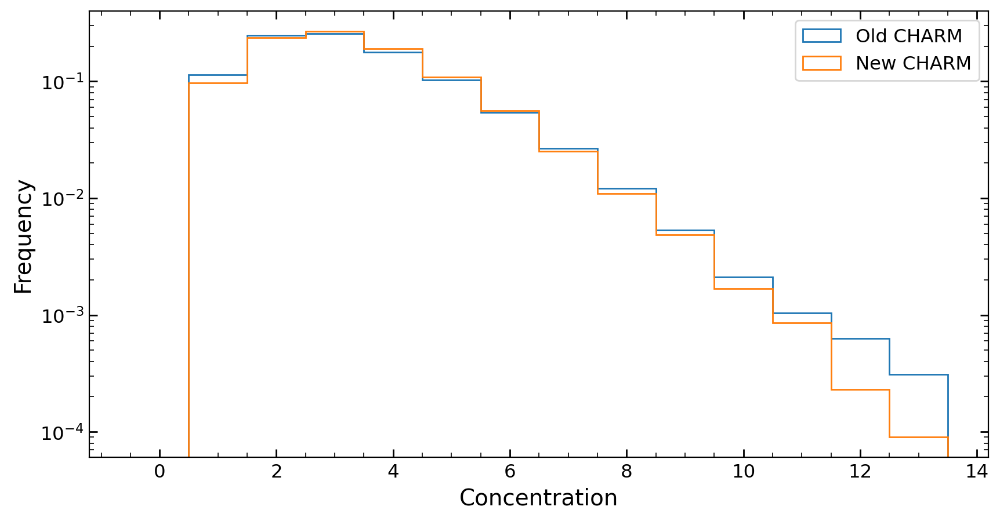

In [7]:
f, ax = plt.subplots(figsize=(10, 5))

ax.semilogy()
mbins = np.arange(15)-0.5
# ax.hist(true['concentration'], bins=mbins, histtype='step',
#         label='True Quijote', density=True)
ax.hist(old['concentration'], bins=mbins, histtype='step',
        label='Old CHARM', density=True)
ax.hist(new['concentration'], bins=mbins, histtype='step',
        label='New CHARM', density=True)
ax.set_xlabel('Concentration')
ax.set_ylabel('Frequency')
ax.legend()

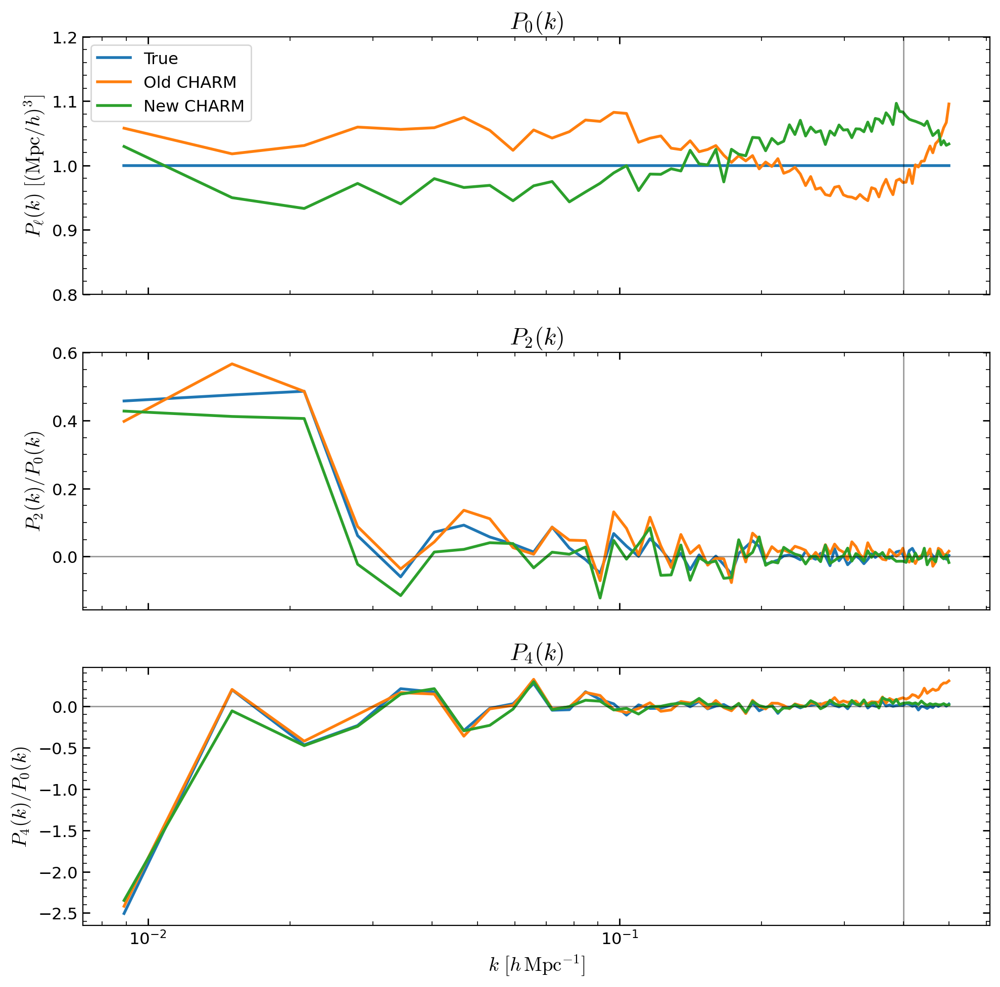

In [8]:
import MAS_library as MASL
import Pk_library as PKL

# Pylians-based P(k) multipoles from halo catalogs (real-space positions)

MAS = "TSC"
threads = 16
Ngrid = 256  # use existing grid size (128)


def pk_multipoles_from_pos(pos, Lbox, Ngrid=128, MAS="CIC", axis=0, threads=8, kmax=0.5):
    # Build density grid
    delta = np.zeros((Ngrid, Ngrid, Ngrid), dtype=np.float32)
    MASL.MA(pos.astype(np.float32), delta, Lbox, MAS)
    delta = delta / delta.mean(dtype=np.float64) - 1.0

    # Compute multipoles (ell=0,2,4)
    pk = PKL.Pk(delta, Lbox, axis=axis, MAS=MAS, threads=threads, verbose=False)
    k = pk.k3D
    P0 = pk.Pk[:, 0].copy()
    P2 = pk.Pk[:, 1].copy()
    P4 = pk.Pk[:, 2].copy()

    mask = k <= kmax
    k, P0, P2, P4 = k[mask], P0[mask], P2[mask], P4[mask]

    # Poisson shot-noise subtraction for monopole
    nbar = pos.shape[0] / (Lbox**3)
    # P0 -= 1.0 / nbar
    return k, P0, P2, P4


k_t, P0_t, P2_t, P4_t = pk_multipoles_from_pos(
    true["pos"], L, Ngrid=Ngrid, MAS=MAS, axis=0, threads=threads)
k_o, P0_o, P2_o, P4_o = pk_multipoles_from_pos(
    old["pos"],  L, Ngrid=Ngrid, MAS=MAS, axis=0, threads=threads)
k_n, P0_n, P2_n, P4_n = pk_multipoles_from_pos(
    new["pos"],  L, Ngrid=Ngrid, MAS=MAS, axis=0, threads=threads)

fig, axs = plt.subplots(3, 1, figsize=(10, 10), sharex=True)

# Monopole
axs[0].semilogx(k_t, P0_t/P0_t, label="True")
axs[0].semilogx(k_o, P0_o/P0_t, label="Old CHARM")
axs[0].semilogx(k_n, P0_n/P0_t, label="New CHARM")
axs[0].set_title(r"$P_0(k)$")
axs[0].set_ylabel(r"$P_\ell(k)\ [(\mathrm{Mpc}/h)^3]$")
axs[0].set_ylim(0.8, 1.2)
axs[0].axvline(0.4, color="k", lw=1, alpha=0.4)
axs[0].legend()

# Quadrupole
axs[1].semilogx(k_t, P2_t/P0_t, label="True")
axs[1].semilogx(k_o, P2_o/P0_t, label="Old CHARM")
axs[1].semilogx(k_n, P2_n/P0_n, label="New CHARM")
axs[1].axhline(0, color="k", lw=1, alpha=0.4)
axs[1].set_title(r"$P_2(k)$")
axs[1].set_ylabel(r"$P_2(k)/P_0(k)$")
axs[1].axvline(0.4, color="k", lw=1, alpha=0.4)

# Hexadecapole
axs[2].semilogx(k_t, P4_t/P0_t, label="True")
axs[2].semilogx(k_o, P4_o/P0_t, label="Old CHARM")
axs[2].semilogx(k_n, P4_n/P0_n, label="New CHARM")
axs[2].axhline(0, color="k", lw=1, alpha=0.4)
axs[2].set_title(r"$P_4(k)$")
axs[2].set_xlabel(r"$k\ [h\,\mathrm{Mpc}^{-1}]$")
axs[2].set_ylabel(r"$P_4(k)/P_0(k)$")
axs[2].axvline(0.4, color="k", lw=1, alpha=0.4)

plt.tight_layout()

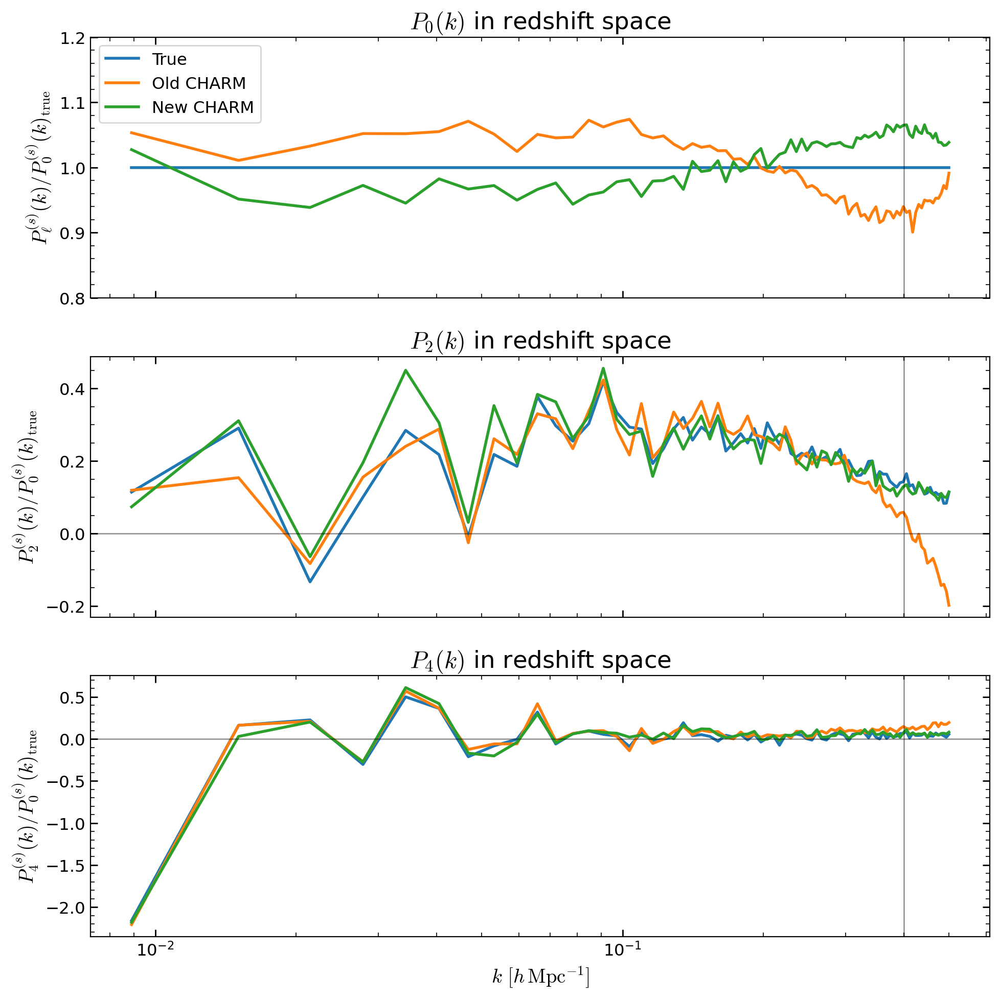

In [9]:
# Redshift-space P(k) multipoles from halo catalogs (plane-parallel RSD)
# LOS axis can be changed (0->x, 1->y, 2->z)
los_axis = 2
a_float = 1.0 / (1.0 + z)
H_z = cosmo.H(z).value  # km/s/Mpc
h = cosmo.h


def pk_multipoles_from_pos_vel_rsd(
        pos, vel, Lbox, z, axis=2, Ngrid=128, MAS="CIC", threads=8, kmax=0.5):
    a_float = 1.0 / (1.0 + z)
    H_z = cosmo.H(z).value  # km/s/Mpc
    h = cosmo.h

    pos_rsd = pos.astype(np.float32).copy()
    # Convert v/(aH) [Mpc] -> [Mpc/h] via *h, then wrap in box
    pos_rsd[:, axis] = (pos_rsd[:, axis] + vel[:, axis]
                        * h / (a_float * H_z)) % Lbox

    delta = np.zeros((Ngrid, Ngrid, Ngrid), dtype=np.float32)
    MASL.MA(pos_rsd, delta, Lbox, MAS)
    delta = delta / delta.mean(dtype=np.float64) - 1.0

    pk = PKL.Pk(delta, Lbox, axis=axis, MAS=MAS, threads=threads, verbose=False)
    k = pk.k3D
    P0 = pk.Pk[:, 0].copy()
    P2 = pk.Pk[:, 1].copy()
    P4 = pk.Pk[:, 2].copy()

    mask = k <= kmax
    k, P0, P2, P4 = k[mask], P0[mask], P2[mask], P4[mask]

    # Shot-noise subtraction for monopole
    nbar = pos.shape[0] / (Lbox**3)
    # P0 -= 1.0 / nbar
    return k, P0, P2, P4


k_t_r, P0_t_r, P2_t_r, P4_t_r = pk_multipoles_from_pos_vel_rsd(
    true["pos"], true["vel"], L, z, axis=los_axis, Ngrid=Ngrid, MAS=MAS, threads=threads
)
k_o_r, P0_o_r, P2_o_r, P4_o_r = pk_multipoles_from_pos_vel_rsd(
    old["pos"], old["vel"], L, z, axis=los_axis, Ngrid=Ngrid, MAS=MAS, threads=threads
)
k_n_r, P0_n_r, P2_n_r, P4_n_r = pk_multipoles_from_pos_vel_rsd(
    new["pos"], new["vel"], L, z, axis=los_axis, Ngrid=Ngrid, MAS=MAS, threads=threads
)

fig, axs = plt.subplots(3, 1, figsize=(10, 10), sharex=True)

axs[0].semilogx(k_t_r, P0_t_r / P0_t_r, label="True")
axs[0].semilogx(k_o_r, P0_o_r / P0_t_r, label="Old CHARM")
axs[0].semilogx(k_n_r, P0_n_r / P0_t_r, label="New CHARM")
axs[0].set_title(r"$P_0(k)$ in redshift space")
axs[0].set_ylabel(r"$P_\ell^{(s)}(k)/P_0^{(s)}(k)_{\rm true}$")
axs[0].set_ylim(0.8, 1.2)
axs[0].axvline(0.4, color="k", lw=1, alpha=0.4)
axs[0].legend()

axs[1].semilogx(k_t_r, P2_t_r / P0_t_r, label="True")
axs[1].semilogx(k_o_r, P2_o_r / P0_t_r, label="Old CHARM")
axs[1].semilogx(k_n_r, P2_n_r / P0_t_r, label="New CHARM")
axs[1].axhline(0, color="k", lw=1, alpha=0.4)
axs[1].set_title(r"$P_2(k)$ in redshift space")
axs[1].set_ylabel(r"$P_2^{(s)}(k)/P_0^{(s)}(k)_{\rm true}$")
axs[1].axvline(0.4, color="k", lw=1, alpha=0.4)

axs[2].semilogx(k_t_r, P4_t_r / P0_t_r, label="True")
axs[2].semilogx(k_o_r, P4_o_r / P0_t_r, label="Old CHARM")
axs[2].semilogx(k_n_r, P4_n_r / P0_t_r, label="New CHARM")
axs[2].axhline(0, color="k", lw=1, alpha=0.4)
axs[2].set_title(r"$P_4(k)$ in redshift space")
axs[2].set_xlabel(r"$k\ [h\,\mathrm{Mpc}^{-1}]$")
axs[2].set_ylabel(r"$P_4^{(s)}(k)/P_0^{(s)}(k)_{\rm true}$")
axs[2].axvline(0.4, color="k", lw=1, alpha=0.4)

plt.tight_layout()

In [11]:
# Measure real- and redshift-space P(k) multipoles for 20 random lhids
from tqdm import tqdm

rng = np.random.default_rng(42)
n_lhid = 20
lhid_pool = rng.choice(2000, size=200, replace=False)  # candidates

results = {
    'k': None,
    'real': {'P0': [], 'P2': [], 'P4': []},  # residuals new vs true
    'zspace': {'P0': [], 'P2': [], 'P4': []},
    'lhids': [],
}

pbar = tqdm(lhid_pool, desc='lhids')
for cur in pbar:
    if len(results['lhids']) >= n_lhid:
        break
    truepath_i = join(wdir, truesim, f'L{L}-N{N}', str(cur))
    newpath_i = join(wdir, newsim, f'L{L}-N{N}', str(cur))
    tf = join(truepath_i, 'halos.h5')
    nf = join(newpath_i, 'halos.h5')
    if not (exists(tf) and exists(nf)):
        continue
    try:
        with h5py.File(tf, 'r') as fp:
            true_i = {k: fp[a][str(k)][:] for k in list(fp[a].keys())}
        with h5py.File(nf, 'r') as fp:
            new_i = {k: fp[a][str(k)][:] for k in list(fp[a].keys())}
    except (KeyError, OSError):
        continue

    cosmo_i = cosmo_to_astropy(load_params(
        cur, '/u/maho3/git/ltu-cmass/params/latin_hypercube_params.txt'))

    # real space
    k_t, P0_t, P2_t, P4_t = pk_multipoles_from_pos(
        true_i['pos'], L, Ngrid=Ngrid, MAS=MAS, axis=0, threads=threads)
    k_n, P0_n, P2_n, P4_n = pk_multipoles_from_pos(
        new_i['pos'], L, Ngrid=Ngrid, MAS=MAS, axis=0, threads=threads)

    # redshift space (RSD function reads the global `cosmo`)
    cosmo = cosmo_i
    _, P0_t_r, P2_t_r, P4_t_r = pk_multipoles_from_pos_vel_rsd(
        true_i['pos'], true_i['vel'], L, z, axis=los_axis,
        Ngrid=Ngrid, MAS=MAS, threads=threads)
    _, P0_n_r, P2_n_r, P4_n_r = pk_multipoles_from_pos_vel_rsd(
        new_i['pos'], new_i['vel'], L, z, axis=los_axis,
        Ngrid=Ngrid, MAS=MAS, threads=threads)

    if results['k'] is None:
        results['k'] = k_t

    results['real']['P0'].append(P0_n / P0_t)
    results['real']['P2'].append((P2_n - P2_t) / P0_t)
    results['real']['P4'].append((P4_n - P4_t) / P0_t)
    results['zspace']['P0'].append(P0_n_r / P0_t_r)
    results['zspace']['P2'].append((P2_n_r - P2_t_r) / P0_t_r)
    results['zspace']['P4'].append((P4_n_r - P4_t_r) / P0_t_r)
    results['lhids'].append(int(cur))
    pbar.set_postfix(found=len(results['lhids']))

for space in ('real', 'zspace'):
    for ell in ('P0', 'P2', 'P4'):
        results[space][ell] = np.array(results[space][ell])

print(
    f"Computed P(k) residuals for {len(results['lhids'])} lhids: {results['lhids']}")

lhids:   0%|          | 0/200 [00:00<?, ?it/s]

lhids:  10%|█         | 20/200 [02:08<19:17,  6.43s/it, found=20]

Computed P(k) residuals for 20 lhids: [692, 989, 886, 177, 175, 653, 932, 1258, 455, 1167, 1091, 1792, 1062, 1499, 1394, 733, 1906, 1291, 1536, 416]


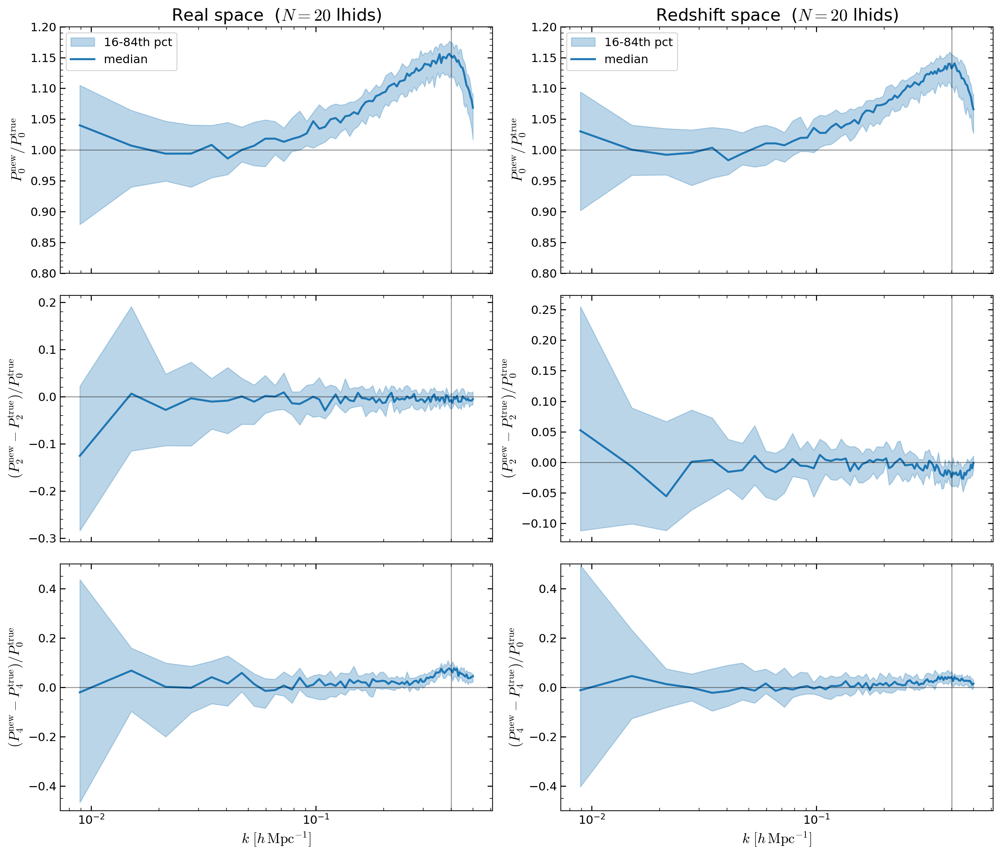

In [12]:
# Plot median and 16-84th percentile residuals w.r.t. true Quijote
k = results['k']
fig, axs = plt.subplots(3, 2, figsize=(14, 12), sharex=True)

spaces = [('real', 'Real space'), ('zspace', 'Redshift space')]
rows = [
    ('P0', r'$P_0^{\rm new}/P_0^{\rm true}$', 1.0),
    ('P2', r'$(P_2^{\rm new}-P_2^{\rm true})/P_0^{\rm true}$', 0.0),
    ('P4', r'$(P_4^{\rm new}-P_4^{\rm true})/P_0^{\rm true}$', 0.0),
]

for j, (space, stitle) in enumerate(spaces):
    for i, (ell, ylabel, ref) in enumerate(rows):
        ax = axs[i, j]
        data = results[space][ell]
        med = np.nanmedian(data, axis=0)
        lo = np.nanpercentile(data, 16, axis=0)
        hi = np.nanpercentile(data, 84, axis=0)
        ax.fill_between(k, lo, hi, alpha=0.3, color='C0', label='16-84th pct')
        ax.semilogx(k, med, color='C0', label='median')
        ax.axhline(ref, color='k', lw=1, alpha=0.4)
        ax.axvline(0.4, color='k', lw=1, alpha=0.4)
        ax.set_ylabel(ylabel)
        if i == 0:
            ax.set_title(f'{stitle}  ($N={len(results["lhids"])}$ lhids)')
            ax.set_ylim(0.8, 1.2)
            ax.legend()
        if i == 2:
            ax.set_xlabel(r'$k\ [h\,\mathrm{Mpc}^{-1}]$')
            ax.set_ylim(-0.5, 0.5)

plt.tight_layout()

In [ ]:
','.join([str(i) for i in results["lhids"]])

## Scratch

### Check that we're using the right cosmologies

1. confirm fastpm was run with quijote and fastpm_CHARM was run with sobol
2. confirm that the combination in fastpm_4k is uniform and correct
3. figure out what cosmologies were summaries run in fastpm_4k
4. create a new param set so as not to mess this up again

In [4]:
import pandas as pd

labels = ['omegaM', 'omegaB', 'h', 'ns', 'sigma8']

filepath = '/u/maho3/git/ltu-cmass/params/latin_hypercube_params.txt'
cosmos1 = pd.DataFrame(np.loadtxt(filepath), columns=labels)

filepath = '/u/maho3/git/ltu-cmass/params/big_sobol_params.txt'
cosmos2 = pd.DataFrame(np.loadtxt(filepath), columns=labels)

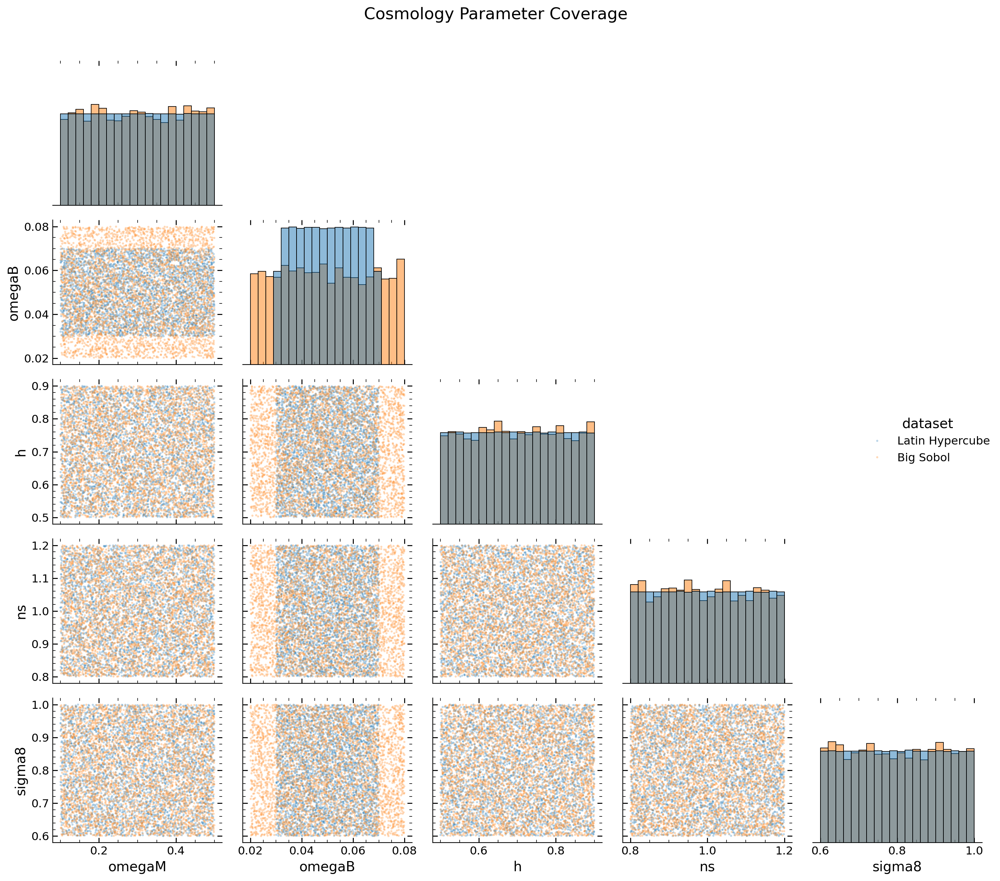

In [5]:
import seaborn as sns

cosmos1['dataset'] = 'Latin Hypercube'
cosmos2_sample = cosmos2.sample(len(cosmos1), random_state=42)
cosmos2_sample['dataset'] = 'Big Sobol'

combined = pd.concat([cosmos1, cosmos2_sample], ignore_index=True)

pg = sns.pairplot(combined, hue='dataset', corner=True,
                  plot_kws={'alpha': 0.3, 's': 5},
                  diag_kind='hist',
                  diag_kws={'alpha': 0.5, 'bins': 20})
pg.figure.suptitle('Cosmology Parameter Coverage', y=1.01)
plt.tight_layout()

In [6]:
from omegaconf import OmegaConf
from tqdm import tqdm

# FastPM
suitepath = '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm/L1000-N128'
fastpm_lhids = sorted(os.listdir(suitepath))
fastpm_cosmos = []
for lhid in tqdm(fastpm_lhids):
    filedir = join(suitepath, lhid)
    filepath = join(filedir, 'config.yaml')
    try:
        cfg = OmegaConf.load(filepath)
        fastpm_cosmos.append(cfg.nbody.cosmo)
    except Exception as e:
        print(f"Error loading {lhid}: {e}")

# FastPM_CAMELS
suitepath = '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_CAMELS/L1000-N128'
fastpm_CAMELS_lhids = sorted(os.listdir(suitepath))
fastpm_CAMELS_cosmos = []
for lhid in tqdm(fastpm_CAMELS_lhids):
    filedir = join(suitepath, lhid)
    filepath = join(filedir, 'config.yaml')
    try:
        cfg = OmegaConf.load(filepath)
        fastpm_CAMELS_cosmos.append(cfg.nbody.cosmo)
    except Exception as e:
        print(f"Error loading {lhid}: {e}")

# FastPM_4k
suitepath = '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k/L1000-N128'
fastpm_4k_lhids = sorted(os.listdir(suitepath))
fastpm_4k_cosmos = []
for lhid in tqdm(fastpm_4k_lhids):
    filedir = join(suitepath, lhid)
    filepath = join(filedir, 'config.yaml')
    try:
        cfg = OmegaConf.load(filepath)
        fastpm_4k_cosmos.append(cfg.nbody.cosmo)
    except Exception as e:
        print(f"Error loading {lhid}: {e}")

100%|██████████| 4133/4133 [01:14<00:00, 55.19it/s]


In [7]:
fastpm_cosmos, fastpm_CAMELS_cosmos, fastpm_4k_cosmos = map(
    lambda x: np.array(x), [fastpm_cosmos, fastpm_CAMELS_cosmos, fastpm_4k_cosmos])

In [8]:
import scipy.stats as stats

datasets = {
    'fastpm': fastpm_cosmos,
    'fastpm_CAMELS': fastpm_CAMELS_cosmos,
    'fastpm_4k': fastpm_4k_cosmos,
}

param_ranges = {
    'omegaM': (0.1, 0.5),
    'omegaB': (0.03, 0.07),
    'h':      (0.5, 0.9),
    'ns':     (0.8, 1.2),
    'sigma8': (0.6, 1.0),
}

for name, cosmos_list in datasets.items():
    arr = np.array(cosmos_list)
    print(f"\n{'='*50}")
    print(f"Dataset: {name}  (N={len(arr)})")
    print(f"{'Param':<10} {'Min':>8} {'Max':>8} {'KS stat':>10} {'KS p-val':>10}")
    print('-'*50)
    for i, (param, (lo, hi)) in enumerate(param_ranges.items()):
        col = arr[:, i]
        col_norm = (col - lo) / (hi - lo)  # should be ~U(0,1)
        ks_stat, ks_p = stats.kstest(col_norm, 'uniform')
        print(
            f"{param:<10} {col.min():>8.4f} {col.max():>8.4f} {ks_stat:>10.4f} {ks_p:>10.4f}")


Dataset: fastpm  (N=2800)
Param           Min      Max    KS stat   KS p-val
--------------------------------------------------
omegaM       0.1001   0.4999     0.0057     1.0000
omegaB       0.0300   0.0700     0.0037     1.0000
h            0.5001   0.8999     0.0072     0.9983
ns           0.8001   1.1999     0.0074     0.9977
sigma8       0.6001   0.9999     0.0062     0.9999

Dataset: fastpm_CAMELS  (N=2000)
Param           Min      Max    KS stat   KS p-val
--------------------------------------------------
omegaM       0.1001   0.4999     0.0012     1.0000
omegaB       0.0200   0.0800     0.1670     0.0000
h            0.5001   0.9000     0.0014     1.0000
ns           0.8001   1.1998     0.0015     1.0000
sigma8       0.6001   0.9998     0.0013     1.0000

Dataset: fastpm_4k  (N=4133)
Param           Min      Max    KS stat   KS p-val
--------------------------------------------------
omegaM       0.1001   0.4999     0.0042     1.0000
omegaB       0.0300   0.0700     0.0027   

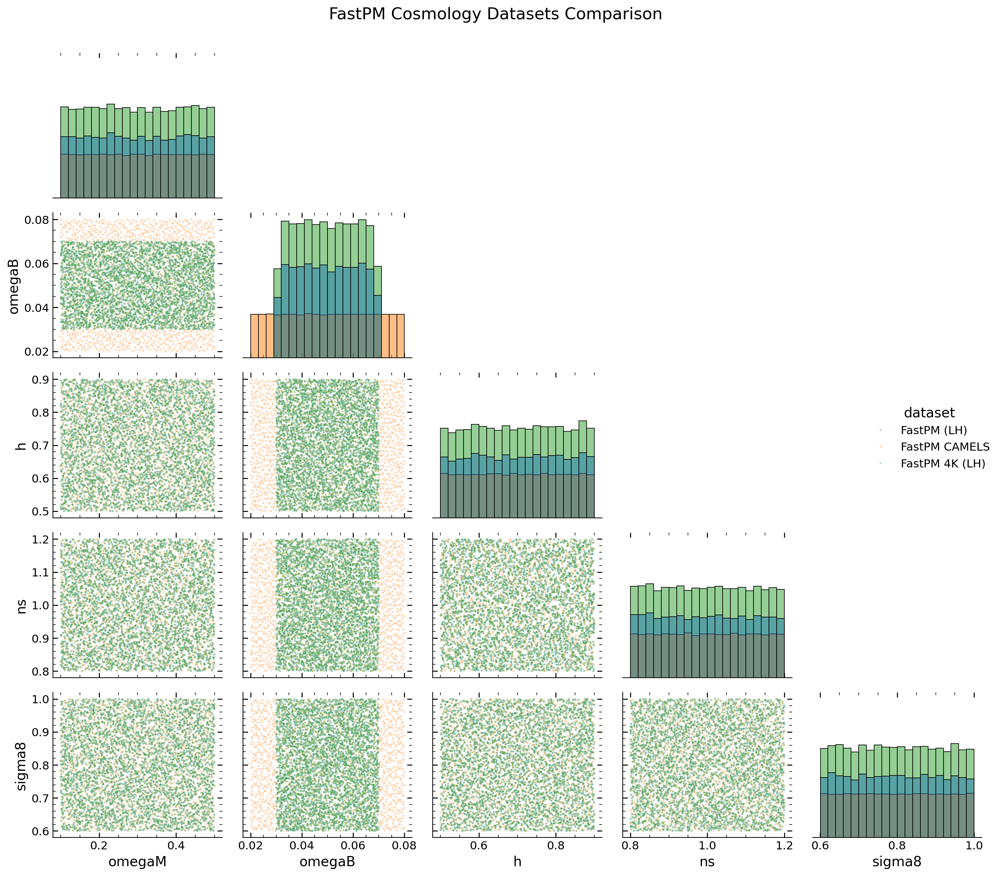

In [9]:
# Corner plot comparison of the three FastPM cosmology datasets

fastpm_df = pd.DataFrame(fastpm_cosmos, columns=labels)
fastpm_CAMELS_df = pd.DataFrame(fastpm_CAMELS_cosmos, columns=labels)
fastpm_4k_df = pd.DataFrame(fastpm_4k_cosmos, columns=labels)

fastpm_df['dataset'] = 'FastPM (LH)'
fastpm_CAMELS_df['dataset'] = 'FastPM CAMELS'
fastpm_4k_df['dataset'] = 'FastPM 4K (LH)'

combined_fastpm = pd.concat(
    [fastpm_df, fastpm_CAMELS_df, fastpm_4k_df],
    ignore_index=True
)

pg = sns.pairplot(
    combined_fastpm,
    hue='dataset',
    corner=True,
    plot_kws={'alpha': 0.3, 's': 5},
    diag_kws={'alpha': 0.5, 'bins': 20},
    diag_kind='hist',
)
pg.figure.suptitle('FastPM Cosmology Datasets Comparison', y=1.001)
plt.tight_layout()

In [56]:
# FastPM_4k_hodz
suitepath = '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128'
fastpm_4k_hodz_lhids = []
fastpm_4k_hodz_cosmos = []
for lhid in tqdm(sorted(os.listdir(suitepath))[:]):
    filepath = join(suitepath, str(lhid), 'diag', 'galaxies')
    try:
        filename = os.listdir(filepath)[0]
        with h5py.File(join(filepath, filename), 'r') as f:
            c = f.attrs['cosmo_params']
        fastpm_4k_hodz_cosmos.append(c)
        fastpm_4k_hodz_lhids.append(lhid)
    except Exception as e:
        print(f"Error loading {lhid}: {e}")

  4%|▎         | 121/3333 [00:00<00:19, 164.61it/s]

Error loading 1072: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1072/diag/galaxies'
Error loading 1073: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1073/diag/galaxies'
Error loading 1074: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1074/diag/galaxies'
Error loading 1075: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1075/diag/galaxies'
Error loading 1079: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1079/diag/galaxies'
Error loading 1082: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1082/diag/galaxies'
Error loading 1083: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1

  7%|▋         | 221/3333 [00:01<00:17, 177.79it/s]

Error loading 1180: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1180/diag/galaxies'
Error loading 1181: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1181/diag/galaxies'
Error loading 1183: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1183/diag/galaxies'
Error loading 1184: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1184/diag/galaxies'
Error loading 1185: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1185/diag/galaxies'


 10%|▉         | 323/3333 [00:02<00:23, 125.93it/s]

Error loading 127: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/127/diag/galaxies'
Error loading 128: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/128/diag/galaxies'
Error loading 129: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/129/diag/galaxies'


 10%|█         | 338/3333 [00:02<00:22, 130.65it/s]

Error loading 130: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/130/diag/galaxies'
Error loading 131: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/131/diag/galaxies'


 11%|█▏        | 382/3333 [00:02<00:26, 110.74it/s]

Error loading 132: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/132/diag/galaxies'
Error loading 1327: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1327/diag/galaxies'
Error loading 1328: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1328/diag/galaxies'
Error loading 1329: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1329/diag/galaxies'
Error loading 133: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/133/diag/galaxies'
Error loading 1330: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1330/diag/galaxies'
Error loading 1331: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-

 17%|█▋        | 553/3333 [00:04<00:20, 133.84it/s]

Error loading 1472: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1472/diag/galaxies'
Error loading 1473: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1473/diag/galaxies'
Error loading 1474: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1474/diag/galaxies'
Error loading 1475: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1475/diag/galaxies'
Error loading 1479: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1479/diag/galaxies'
Error loading 1482: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1482/diag/galaxies'
Error loading 1483: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1

 20%|█▉        | 663/3333 [00:05<00:22, 118.57it/s]

Error loading 1580: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1580/diag/galaxies'
Error loading 1581: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1581/diag/galaxies'
Error loading 1583: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1583/diag/galaxies'
Error loading 1584: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1584/diag/galaxies'
Error loading 1585: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1585/diag/galaxies'


 25%|██▍       | 832/3333 [00:06<00:18, 133.46it/s]

Error loading 1727: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1727/diag/galaxies'
Error loading 1728: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1728/diag/galaxies'
Error loading 1729: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1729/diag/galaxies'
Error loading 1730: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1730/diag/galaxies'
Error loading 1731: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1731/diag/galaxies'
Error loading 1732: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1732/diag/galaxies'
Error loading 1733: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1

 30%|███       | 1007/3333 [00:07<00:15, 147.55it/s]

Error loading 1872: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1872/diag/galaxies'
Error loading 1873: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1873/diag/galaxies'
Error loading 1874: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1874/diag/galaxies'
Error loading 1875: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1875/diag/galaxies'
Error loading 1879: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1879/diag/galaxies'
Error loading 1882: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1882/diag/galaxies'
Error loading 1883: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1

 33%|███▎      | 1106/3333 [00:08<00:15, 147.71it/s]

Error loading 1980: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1980/diag/galaxies'
Error loading 1981: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1981/diag/galaxies'
Error loading 1983: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1983/diag/galaxies'
Error loading 1984: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1984/diag/galaxies'
Error loading 1985: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/1985/diag/galaxies'


 37%|███▋      | 1229/3333 [00:09<00:14, 140.45it/s]

Error loading 2127: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2127/diag/galaxies'
Error loading 2128: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2128/diag/galaxies'
Error loading 2129: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2129/diag/galaxies'
Error loading 2132: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2132/diag/galaxies'


 40%|████      | 1344/3333 [00:10<00:13, 142.43it/s]

Error loading 2274: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2274/diag/galaxies'
Error loading 2275: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2275/diag/galaxies'
Error loading 2282: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2282/diag/galaxies'
Error loading 2283: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2283/diag/galaxies'


 43%|████▎     | 1427/3333 [00:11<00:13, 142.89it/s]

Error loading 2380: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2380/diag/galaxies'
Error loading 2381: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2381/diag/galaxies'
Error loading 2383: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2383/diag/galaxies'
Error loading 2384: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2384/diag/galaxies'
Error loading 2385: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2385/diag/galaxies'


 47%|████▋     | 1552/3333 [00:11<00:12, 139.71it/s]

Error loading 2528: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2528/diag/galaxies'
Error loading 2529: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2529/diag/galaxies'
Error loading 2532: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2532/diag/galaxies'
Error loading 2533: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2533/diag/galaxies'


 49%|████▉     | 1647/3333 [00:12<00:13, 123.43it/s]

Error loading 2672: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2672/diag/galaxies'
Error loading 2673: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2673/diag/galaxies'
Error loading 2679: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2679/diag/galaxies'
Error loading 2682: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2682/diag/galaxies'
Error loading 2683: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2683/diag/galaxies'
Error loading 2684: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2684/diag/galaxies'


 51%|█████     | 1685/3333 [00:13<00:14, 115.89it/s]

Error loading 272: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/272/diag/galaxies'
Error loading 273: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/273/diag/galaxies'
Error loading 274: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/274/diag/galaxies'
Error loading 275: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/275/diag/galaxies'


 52%|█████▏    | 1734/3333 [00:13<00:12, 124.99it/s]

Error loading 2780: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2780/diag/galaxies'
Error loading 2781: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2781/diag/galaxies'
Error loading 2783: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2783/diag/galaxies'
Error loading 2784: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2784/diag/galaxies'
Error loading 2785: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2785/diag/galaxies'
Error loading 279: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/279/diag/galaxies'


 53%|█████▎    | 1764/3333 [00:13<00:12, 125.24it/s]

Error loading 282: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/282/diag/galaxies'
Error loading 283: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/283/diag/galaxies'
Error loading 284: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/284/diag/galaxies'


 56%|█████▌    | 1861/3333 [00:14<00:10, 146.90it/s]

Error loading 2927: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2927/diag/galaxies'
Error loading 2928: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2928/diag/galaxies'
Error loading 2929: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2929/diag/galaxies'
Error loading 2930: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2930/diag/galaxies'
Error loading 2931: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2931/diag/galaxies'
Error loading 2932: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/2932/diag/galaxies'
Error loading 2933: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1

 59%|█████▉    | 1961/3333 [00:15<00:10, 129.47it/s]

Error loading 3072: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3072/diag/galaxies'
Error loading 3073: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3073/diag/galaxies'
Error loading 3074: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3074/diag/galaxies'
Error loading 3075: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3075/diag/galaxies'


 61%|██████▏   | 2047/3333 [00:15<00:10, 122.09it/s]

Error loading 3183: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3183/diag/galaxies'
Error loading 3184: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3184/diag/galaxies'
Error loading 3185: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3185/diag/galaxies'


 65%|██████▌   | 2170/3333 [00:16<00:08, 142.06it/s]

Error loading 3327: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3327/diag/galaxies'
Error loading 3328: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3328/diag/galaxies'
Error loading 3329: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3329/diag/galaxies'
Error loading 3332: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3332/diag/galaxies'


 68%|██████▊   | 2280/3333 [00:17<00:07, 138.44it/s]

Error loading 3472: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3472/diag/galaxies'
Error loading 3473: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3473/diag/galaxies'
Error loading 3479: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3479/diag/galaxies'
Error loading 3482: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3482/diag/galaxies'
Error loading 3483: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3483/diag/galaxies'
Error loading 3484: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3484/diag/galaxies'


 71%|███████   | 2368/3333 [00:18<00:07, 126.99it/s]

Error loading 3580: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3580/diag/galaxies'
Error loading 3581: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3581/diag/galaxies'
Error loading 3583: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3583/diag/galaxies'
Error loading 3584: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3584/diag/galaxies'
Error loading 3585: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3585/diag/galaxies'


 74%|███████▍  | 2473/3333 [00:19<00:06, 127.58it/s]

Error loading 3727: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3727/diag/galaxies'
Error loading 3728: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3728/diag/galaxies'
Error loading 3729: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3729/diag/galaxies'
Error loading 3732: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3732/diag/galaxies'
Error loading 3733: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3733/diag/galaxies'


 76%|███████▌  | 2536/3333 [00:19<00:05, 143.51it/s]

Error loading 380: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/380/diag/galaxies'
Error loading 381: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/381/diag/galaxies'
Error loading 383: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/383/diag/galaxies'


 77%|███████▋  | 2573/3333 [00:19<00:04, 159.75it/s]

Error loading 384: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/384/diag/galaxies'
Error loading 385: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/385/diag/galaxies'
Error loading 3872: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3872/diag/galaxies'
Error loading 3873: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3873/diag/galaxies'
Error loading 3879: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3879/diag/galaxies'
Error loading 3882: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3882/diag/galaxies'
Error loading 3883: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-

 80%|████████  | 2675/3333 [00:20<00:04, 151.00it/s]

Error loading 3980: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3980/diag/galaxies'
Error loading 3981: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3981/diag/galaxies'
Error loading 3983: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/3983/diag/galaxies'


 85%|████████▍ | 2829/3333 [00:21<00:03, 162.05it/s]

Error loading 527: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/527/diag/galaxies'
Error loading 528: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/528/diag/galaxies'
Error loading 529: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/529/diag/galaxies'
Error loading 530: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/530/diag/galaxies'
Error loading 531: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/531/diag/galaxies'
Error loading 532: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/532/diag/galaxies'
Error loading 533: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/533/

 90%|████████▉ | 2997/3333 [00:22<00:02, 147.32it/s]

Error loading 672: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/672/diag/galaxies'
Error loading 673: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/673/diag/galaxies'
Error loading 674: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/674/diag/galaxies'
Error loading 675: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/675/diag/galaxies'
Error loading 679: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/679/diag/galaxies'
Error loading 682: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/682/diag/galaxies'
Error loading 683: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/683/

 93%|█████████▎| 3104/3333 [00:23<00:01, 129.88it/s]

Error loading 780: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/780/diag/galaxies'
Error loading 781: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/781/diag/galaxies'
Error loading 783: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/783/diag/galaxies'
Error loading 784: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/784/diag/galaxies'
Error loading 785: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/785/diag/galaxies'


 98%|█████████▊| 3278/3333 [00:24<00:00, 153.52it/s]

Error loading 927: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/927/diag/galaxies'
Error loading 928: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/928/diag/galaxies'
Error loading 929: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/929/diag/galaxies'
Error loading 930: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/930/diag/galaxies'
Error loading 931: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/931/diag/galaxies'
Error loading 932: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/932/diag/galaxies'
Error loading 933: [Errno 2] No such file or directory: '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_4k_hodz/L1000-N128/933/

100%|██████████| 3333/3333 [00:25<00:00, 131.57it/s]


In [57]:
len(fastpm_4k_hodz_lhids), len(fastpm_4k_hodz_cosmos)

(3162, 3162)

In [ ]:
fastpm_4k_lhids = np.array(fastpm_4k_lhids)
fastpm_4k_hodz_lhids = np.array(fastpm_4k_hodz_lhids)
broken_lhid = []
broken_cosmo = []
for i, lhid in enumerate(fastpm_4k_hodz_lhids):
    idx1 = np.argwhere(fastpm_4k_lhids == lhid).flatten()
    idx2 = np.argwhere(fastpm_4k_hodz_lhids == lhid).flatten()
    if len(idx1) == 0 or len(idx2) == 0:
        continue
    idx1 = idx1[0]
    idx2 = idx2[0]
    c1 = fastpm_4k_cosmos[idx1]
    c2 = fastpm_4k_hodz_cosmos[idx2]
    if np.all(c1 != c2):
        broken_lhid.append(lhid)
        broken_cosmo.append([c1, c2])
        print(
            f"lhid {lhid}:\n\thodz={c2},\n\t4k={c1}")
    else:
        print(f"lhid {lhid}: No differences found.")

lhid 0: No differences found.
lhid 1: No differences found.
lhid 10: No differences found.
lhid 100: No differences found.
lhid 1000: No differences found.
lhid 1001: No differences found.
lhid 1002: No differences found.
lhid 1003: No differences found.
lhid 1004: No differences found.
lhid 1005: No differences found.
lhid 1006: No differences found.
lhid 1007: No differences found.
lhid 1008: No differences found.
lhid 1009: No differences found.
lhid 101: No differences found.
lhid 1010: No differences found.
lhid 1011: No differences found.
lhid 1012: No differences found.
lhid 1013: No differences found.
lhid 1014: No differences found.
lhid 1015: No differences found.
lhid 1016: No differences found.
lhid 1017: No differences found.
lhid 1018: No differences found.
lhid 1019: No differences found.
lhid 102: No differences found.
lhid 1020: No differences found.
lhid 1021: No differences found.
lhid 1022: No differences found.
lhid 1023: No differences found.
lhid 1024: No differe

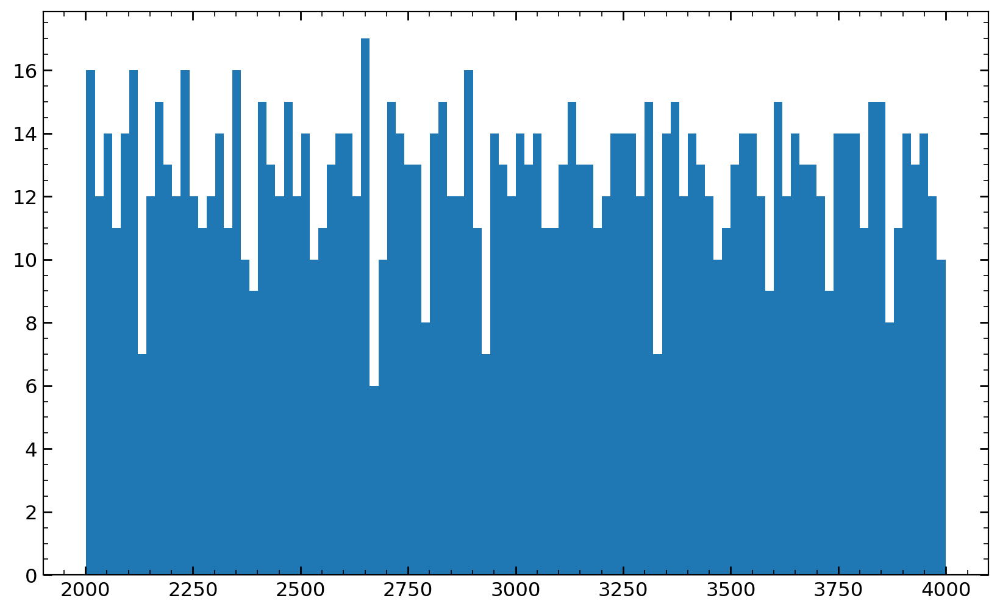

In [ ]:
plt.hist([int(x) for x in broken_lhid], 100)

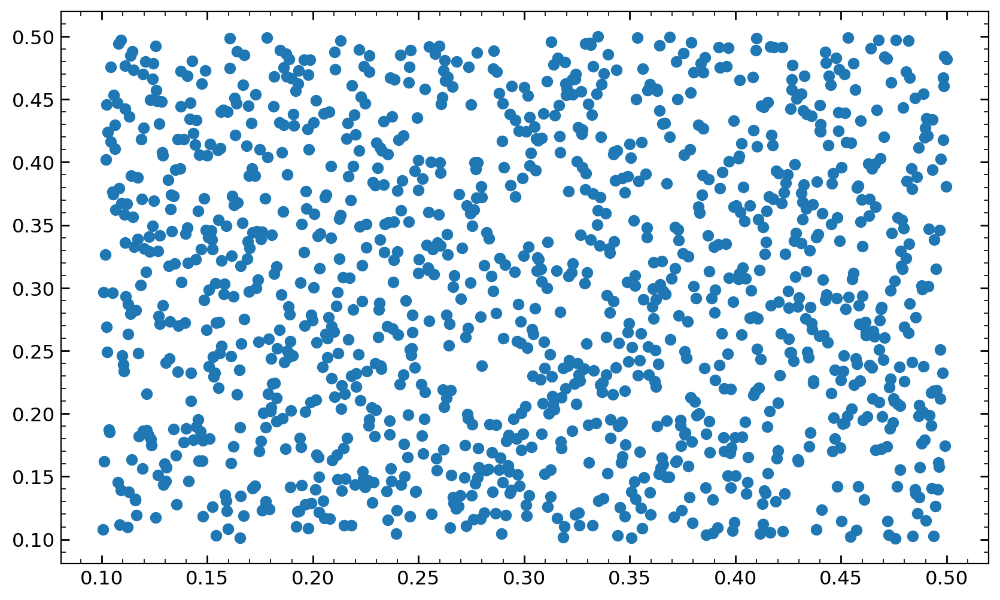

In [63]:
broken_cosmo = np.array(broken_cosmo)
plt.plot(broken_cosmo[:, 0, 0], broken_cosmo[:, 1, 0], 'o')

### Fix the fricken lhids

In [9]:
import multiprocessing as mp
from os.path import join, exists

refpath = '/work/hdd/bdne/maho3/cmass-ili/quijotelike/fastpm_charm3/L1000-N128'


def resolve_path(lhid):
    nbody_link = join(refpath, lhid, 'nbody.h5')
    if exists(nbody_link):
        return (int(lhid), os.path.realpath(nbody_link))
    return None


lhids = os.listdir(refpath)

with mp.Pool(8) as pool:
    results = list(tqdm(pool.imap(resolve_path, lhids), total=len(lhids)))

nbody_paths = {k: v for r in results if r is not None for k, v in [r]}

100%|██████████| 4133/4133 [00:56<00:00, 73.20it/s] 


In [12]:
nbody_sim = {}
nbody_lhid = {}

for r in results:
    if r is not None:
        key, v = r
        x = v.split('/')
        nbody_sim[key] = x[-4]
        nbody_lhid[key] = int(x[-2])

In [14]:
sims_by_key = [(k, nbody_sim[k]) for k in range(5000) if k in nbody_sim]

current_sim = None
start = None
ranges = []

for k, sim in sims_by_key:
    if sim != current_sim:
        if current_sim is not None:
            ranges.append((start, prev_k, current_sim))
        # check for gap
        if start is not None and prev_k != k - 1:
            print(f"GAP: {prev_k+1} - {k-1}")
        current_sim = sim
        start = k
    prev_k = k

# append last range
if current_sim is not None:
    ranges.append((start, prev_k, current_sim))

for start, end, sim in ranges:
    print(f"{start} - {end}: {sim}")

GAP: 2000 - 2001
0 - 1999: fastpm
2002 - 3999: fastpm_CAMELS
4000 - 4799: fastpm


In [ ]:
import numpy as np
param_files = {
    'fastpm': '/u/maho3/git/ltu-cmass/params/latin_hypercube_params.txt',
    'fastpm_CAMELS': '/u/maho3/git/ltu-cmass/params/big_sobol_params.txt'
}


# Load param files
params = {sim: np.loadtxt(path) for sim, path in param_files.items()}

# Build output array - get one row to know ncols
sample_sim = nbody_sim[0]
ncols = params[sample_sim].shape[1]
output = np.full((5000, ncols), np.nan)

for key in range(5000):
    if key in nbody_sim:
        sim = nbody_sim[key]
        lhid = nbody_lhid[key]
        output[key] = params[sim][lhid]

np.savetxt('/u/maho3/git/ltu-cmass/params/stupid_fastpm_4k_params.txt',
           output, fmt='%.6f')

In [20]:
# 1. Check a few known mappings manually
for key in [0, 1000, 2002, 3000, 4000, 4500]:
    sim = nbody_sim[key]
    lhid = nbody_lhid[key]
    print(f"key={key} | sim={sim} | lhid={lhid}")
    print(f"  original: {params[sim][lhid]}")
    print(f"  output:   {output[key]}")

key=0 | sim=fastpm | lhid=0
  original: [0.1755  0.06681 0.7737  0.8849  0.6641 ]
  output:   [0.1755  0.06681 0.7737  0.8849  0.6641 ]
key=1000 | sim=fastpm | lhid=1000
  original: [0.2589  0.05635 0.8975  0.9175  0.6313 ]
  output:   [0.2589  0.05635 0.8975  0.9175  0.6313 ]
key=2002 | sim=fastpm_CAMELS | lhid=2002
  original: [0.43603678 0.04700542 0.69451221 1.06518757 0.64399942]
  output:   [0.43603678 0.04700542 0.69451221 1.06518757 0.64399942]
key=3000 | sim=fastpm_CAMELS | lhid=3000
  original: [0.23509707 0.04658578 0.67374101 0.93174639 0.62509171]
  output:   [0.23509707 0.04658578 0.67374101 0.93174639 0.62509171]
key=4000 | sim=fastpm | lhid=2000
  original: [0.3175 0.049  0.6711 0.9624 0.834 ]
  output:   [0.3175 0.049  0.6711 0.9624 0.834 ]
key=4500 | sim=fastpm | lhid=2500
  original: [0.1805 0.0516 0.5081 0.8524 0.7174]
  output:   [0.1805 0.0516 0.5081 0.8524 0.7174]


In [ ]:
# 2. Check that rows match their source param file stats
for sim, path in param_files.items():
    keys_for_sim = [k for k in range(5000) if nbody_sim.get(k) == sim]
    lhids_for_sim = [nbody_lhid[k] for k in keys_for_sim]

    original = params[sim][lhids_for_sim]
    recovered = output[keys_for_sim]

    print(f"{sim}: max diff = {np.max(np.abs(original - recovered)):.2e}")

fastpm: max diff = 0.00e+00
fastpm_CAMELS: max diff = 0.00e+00
